In [1]:
import numpy as np
import matplotlib.pyplot as plt

from numpy import diagflat, ones, eye, sqrt, zeros, matmul
from numpy.random import randn

from matplotlib import animation, rc
from IPython.display import HTML

%matplotlib notebook

In [2]:
def create_rouse_matrices(N, a, b, c, bound):
    """
    Parameters
    ----------
    N : int
        Chromosome length in terms of numbers of monomers.
        
    b : float
        This value is the diffusion coefficient. 
        D = kbT/zeta
        
    a : float
        Value related to the inverse square bond length.
        a = 3/b^2.
    
    c : float
        Value of the bond strength (similar to the `a` parameter), but used for the 
        "attraction at a distance" force.
    
    Output
    ------
    A : ndarray
      A is the "linkage" matrix, which sets the bond strengths between   
      different monomers along the polymer chain.
    
    Q : ndarray
        This is the "noise" parameter which determines the step size of the polymer movement
        at each moment in time.
    
    """
    
    # dX = A(u(t))*X*dt + dW
    
    # create linkage matrix (i.e. A)
    A = diagflat(-2*ones([N, 1]),0) + diagflat(ones([N-1, 1]), 1) + diagflat(ones([N-1, 1]), -1)
    A = a*b*A;
    end = -1
    if bound==1:
        A[0, end] = c*b
        A[end, 0] = c*b
        A[0, 0] = -a*b - c*b
        A[end, end] = -a*b - c*b
    else:
        A[end, end] = -a*b
        A[0, 0] = -a*b

    M = zeros(A.shape)
    M[:, 0] = 1
    Tr = Tr - M

    # create noise matrix (part of dW)
    Q = sqrt(eye(N)*2*b)
    
    return A, Q 

In [3]:
def simulate_rouse(A,Q,R0,deltaT,T):
    """
    Simulates motion of a Rouse polymer chain. 
    
    Parameters
    ----------
    A : ndarray
      A is the "linkage" matrix, which sets the bond strengths between   
      different monomers along the polymer chain.
    
    Q : ndarray
        This is the "noise" parameter which determines the step size of the polymer movement
        at each moment in time.
    
    R0 : ndarray 
        Stores the initial conformation of the polymer chain.
        `R0` has dimensions (chain length) x (spatial dimensions). 
        
    deltaT : float
        Time interval 
    
    T : int
        Total time for the simulation in real units.
        
    Output
    ------
    Trajectory : dict
        Dictionary containing information on the monomer positions, `R` for each dimension
        and for specified times `t`.    
    
    """
    
    dim = R0.shape[1]
    N = A.shape[0]
    
    # time step array
    t = np.arange(0,T,deltaT)
    if t[-1] < T:
        t = np.r_[t,T]

    # max number of steps
    maxN = len(t);

    Trajectory = {'R':[],'t':t}
    for u in range(dim):
        R = np.zeros([N, maxN]);
        
        R[:, 0] = R0[:,u];
        for j in range(1,maxN):
            dT = t[j] - t[j-1]
            R[:, j] = R[:, j-1] + matmul(A,R[:, j-1])*dT + sqrt(dT)*matmul(Q,randn(N))


        Trajectory['R'].append(R)
        
    return Trajectory
    

## Simulate Rouse polymer dynamics 

In [110]:
#set Rouse parameters
N = 150; # hain length: determines the number of segments in the Rouse model
a = 0.01; # some dummy parameters to construct the model structure
b = 100;
c = 0.0002;
R0 = np.c_[np.arange(N),np.arange(N),np.arange(N)]
A, Q, Tr = createRouseMatrices(N, a, b, c, 1)

T = 10000
deltaT = 0.1

traj = simulate_rouse(A,Q,R0,deltaT,T)

## Animate in 2D

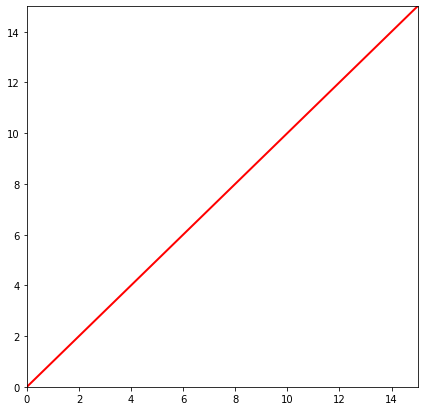

In [132]:
# initialization function: plot the background of each frame

fig, ax = plt.subplots(1,1,figsize=(7,7))
polymer, = ax.plot([], [],'-', lw=2)

def init():
    ax.set_xlim([0,15]) 
    ax.set_ylim([0,15]) 
    polymer.set_xdata(traj['R'][0][:,0])
    polymer.set_ydata(traj['R'][1][:,0])
    ends.set_data([pos_x[0],pos_x[-1]],[pos_y[0],pos_y[-1]])    
    return polymer, ends
 
# animation function. This is called sequentially
def animate(i):
    pos_x = traj['R'][0][:,i]
    pos_y = traj['R'][1][:,i]
    ax.set_xlim([-50,250]) 
    ax.set_ylim([-50,250]) 
    polymer.set_xdata(pos_x)
    polymer.set_ydata(pos_y)
    ends.set_data([pos_x[0],pos_x[-1]],[pos_y[0],pos_y[-1]])
    return polymer, ends,  


polymer, = ax.plot([1], [1],'r-', lw=2)
ends, =  ax.plot([1], [1],'bo', lw=10)

# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=1000, interval=100, blit=True)

In [113]:
HTML(anim.to_html5_video())

## Animate in 3D

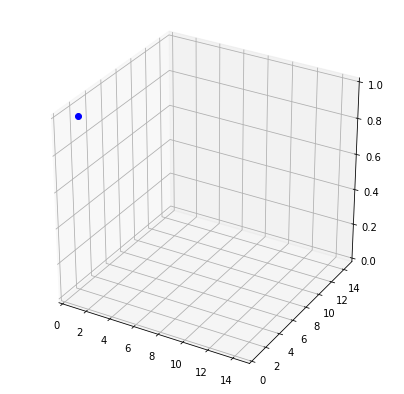

In [128]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111, projection='3d')

# initialization function: plot the background of each frame

polymer, = ax.plot([], [],'-', lw=2)

def init():
    ax.set_xlim([0,15]) 
    ax.set_ylim([0,15]) 
    polymer.set_xdata(traj['R'][0][:,0])
    polymer.set_ydata(traj['R'][1][:,0])
    ends.set_data([pos_x[0],pos_x[-1]],[pos_y[0],pos_y[-1]])    
    return polymer, ends
 
# animation function. This is called sequentially
def animate(i):
    pos_x = traj['R'][0][:,i]
    pos_y = traj['R'][1][:,i]
    pos_z = traj['R'][2][:,i]
    ax.set_xlim([-50,250]) 
    ax.set_ylim([-50,250]) 
    ax.set_zlim([-50,250]) 
    polymer.set_xdata(pos_x)
    polymer.set_ydata(pos_y)
    polymer.set_3d_properties(pos_z)
    ends.set_data([pos_x[0],pos_x[-1]],[pos_y[0],pos_y[-1]] )
    ends.set_3d_properties([pos_z[0],pos_z[-1] ])
    return polymer, ends,  


polymer, = ax.plot([1], [1],[1],'r-', lw=2)
ends, =  ax.plot([1], [1],[1],'bo', lw=10)

# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=1000, interval=100, blit=True)
plt.show()

In [129]:
HTML(anim.to_html5_video())